# Object Detection - Project P5

## Train Model

Inputs: non_vehicles, vehicles images 64x64 png format

## Create Training lists

* non_vehicles directories: extras, GTI
* vehicles dicertories: GTI_far, GTI_Left, GTI_MiddleClose, GTI_Right, KITTI_extracted     

### 1. General Libraries used

In [1]:
import os
import cv2
import random
import glob
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline

### 2. Vehicle & Non-Vechicle Lists

In [ ]:
#################################################################################
#
# Read in CAR lists
#
#################################################################################

car1 = glob.glob("training_data/GTI_Far/*.png")
car2 = glob.glob("training_data/GTI_Left/*.png")
car3 = glob.glob("training_data/GTI_MiddleClose/*.png")
car4 = glob.glob("training_data/GTI_Right/*.png")
car5 = glob.glob("training_data/KITTI_extracted/*png")
# one big list
car_list = car1 + car2 + car3 + car4 + car5

print ('NOTE: size of car list is =',len(car_list))

##################################################################################
#
# Read in NON CAR lists
#
#################################################################################

non_car1 = glob.glob("training_data/GTI/*.png")
non_car2 = glob.glob("training_data/Extras/*.png")
# one big list
non_car_list = non_car1 + non_car2

print ('NOTE: size of non-car list is =',len(non_car_list))

### 3. Plot 3 x Example Images from the data-set


NOTE: display 3 x random training car and non car examples



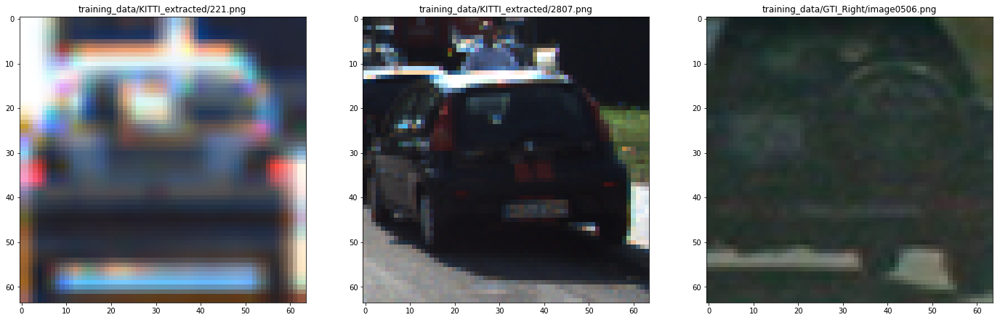

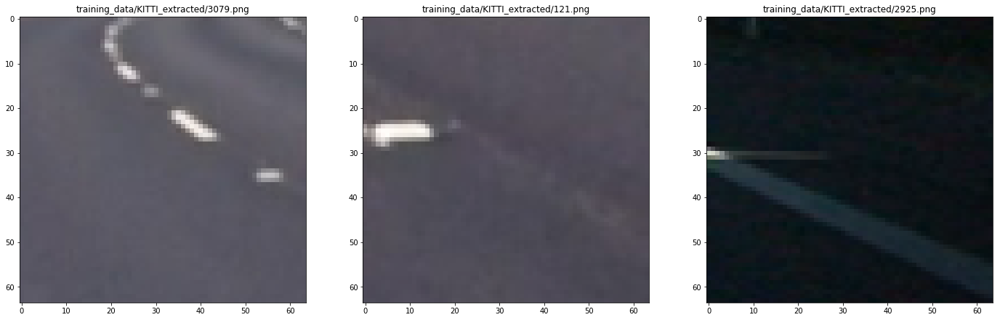

In [5]:
##################################################################################
#
# Print 3 random cars and non cars from data-set
#
#################################################################################

print ()
print ('NOTE: displaying 3 x random training car and non car examples')
print ()

# Save random numbers & images for further steps
car_ex     = np.zeros(3,dtype=int)
non_car_ex = np.zeros(3,dtype=int)

# Get random images
for i in range(3) :
    car_ex[i]     = random.randint(0, len(car_list))
    non_car_ex[i] = random.randint(0, len(non_car_list))
    image_car     = mpimg.imread(car_list[car_ex[i]])
    image_non_car = mpimg.imread(non_car_list[non_car_ex[i]])

    
# Print random cars
plt.rcParams["figure.figsize"] = [24, 12]
plt.subplot(131)
plt.imshow(mpimg.imread(car_list[car_ex[0]]))
plt.title(car_list[car_ex[0]])
plt.subplot(132)
plt.imshow(mpimg.imread(car_list[car_ex[1]]))
plt.title(car_list[car_ex[1]])
plt.subplot(133)
plt.imshow(mpimg.imread(car_list[car_ex[2]]))
plt.title(car_list[car_ex[2]])
plt.show()

# Print random non-cars
plt.rcParams["figure.figsize"] = [24, 12]
plt.subplot(131)
plt.imshow(mpimg.imread(non_car_list[car_ex[0]]))
plt.title(car_list[non_car_ex[0]])
plt.subplot(132)
plt.imshow(mpimg.imread(non_car_list[car_ex[1]]))
plt.title(car_list[non_car_ex[1]])
plt.subplot(133)
plt.imshow(mpimg.imread(non_car_list[car_ex[2]]))
plt.title(car_list[non_car_ex[2]])
plt.show()
       
# Cast random 
car_ex     = np.array(car_ex,dtype=int)
non_car_ex = np.array(non_car_ex,dtype=int)

### 4. HOG, Spatial and Color Histogram Functions

In [19]:
#################################################################################
#
# Functions for color histogram, bin_spatial, hog, plus feature extraction
# as defined in the lectors with small modifications
#
# Functions:     bin_spatial
#                color_hist
#                color_hist_plot
#                get_hog_features
#                color_map 
#                extract_features
#
#################################################################################

from skimage.feature import hog

def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))

def color_hist(img, nbins=32):  
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True,augment = False):
    
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      
          
        if (augment == True) :
            feature_image = cv2.flip(feature_image,1)
            
        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
            
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
            
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)    
        features.append(np.concatenate(file_features))
                
    # Return list of feature vectors
    return features
         
def color_map (img, conv='RGB2YCrCb'):
    
    if cspace == 'RGB2HSV':           
        feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    elif cspace == 'RGB2LUV':           
        feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
    elif cspace == 'RGB2HLS':
        feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    elif cspace == 'RGB2YUV':
        feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
    elif cspace == 'RGB2YCrCb':
        feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)

    return feature_image

### 5. Feature Parameters

In [7]:
#################################################################################
#
# Golden Parameter lists for this session and SVC model
#
#################################################################################

colorspace = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
hist_bins=64
spatial_size=(32, 32)

### 6. Extract Features for model

In [8]:
#################################################################################
#
# Extract features of cars and non cars data-set for model  
#
#################################################################################

print ()
print ('NOTE: extracting features for model...')
print ()

# cars features
car_features = extract_features(car_list, color_space=colorspace, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=True, 
                        hist_feat=True, hog_feat=True, augment=False)


# non cars features
non_car_features = extract_features(non_car_list, color_space=colorspace, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=True, 
                        hist_feat=True, hog_feat=True)


print ()
print ('NOTE: size of cars features:    ',len(car_features))
print ('NOTE: size of non cars featues: ',len(non_car_features))
print ()


NOTE: extracting features for model...



/Users/Carsten/miniconda3/envs/carnd-term1-BC/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)



NOTE: size of cars features     8792
NOTE: size of non cars featues  8968



### 7. Plot extrated Features of the 3 x Example Images from the data-set

In [ ]:
#################################################################################
#
# Plots images features for a hog, spatial and color histogram using all color channels
# 
# Input:     name     = name of image to read
#         
# Ouput:     plots
#
# Calls:     get_hog_features(), bin_spatial(), color_hist()
#
#################################################################################

def plot_details (name) :

    # Print random cars
    image = mpimg.imread(name)

    plt.rcParams["figure.figsize"] = [24, 6]
    plt.subplot(131)
    plt.imshow(image)
    plt.title(name)
    # plot spacial 
    plt.subplot(132)
    features_vec = bin_spatial(cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb), size=spatial_size)
    plt.plot(features_vec)
    plt.title('Spatially Binned Features')
    plt.subplot(133)
    features_vec = color_hist(cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb), nbins=hist_bins)
    plt.plot(features_vec)
    plt.title('Color Histogram Features')
    plt.show()

    # Hog
    image_car = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    features, hog_car0 = get_hog_features(image_car[:,:,0], orient, pix_per_cell, cell_per_block, vis=True, feature_vec=True)
    features, hog_car1 = get_hog_features(image_car[:,:,1], orient, pix_per_cell, cell_per_block, vis=True, feature_vec=True)
    features, hog_car2 = get_hog_features(image_car[:,:,2], orient, pix_per_cell, cell_per_block, vis=True, feature_vec=True)
    # Plot
    plt.rcParams["figure.figsize"] = [24, 6]
    plt.subplot(131)
    plt.imshow(hog_car0,cmap='gray')
    plt.title('HOG channel 0')
    plt.subplot(132)
    plt.imshow(hog_car1,cmap='gray')
    plt.title('HOG channel 1')
    plt.subplot(133)
    plt.imshow(hog_car2,cmap='gray')
    plt.title('HOG channel 2')
    plt.show()


NOTE: displaying feature images of random training car and non car examples



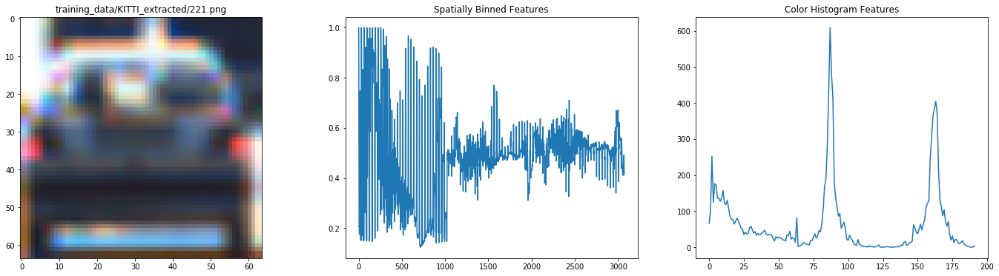

/Users/Carsten/miniconda3/envs/carnd-term1-BC/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


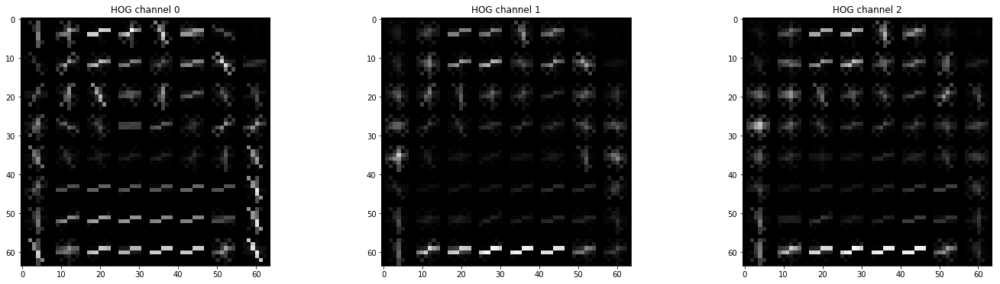

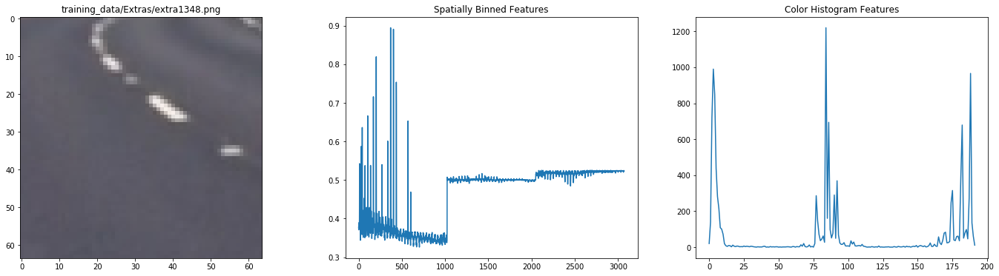

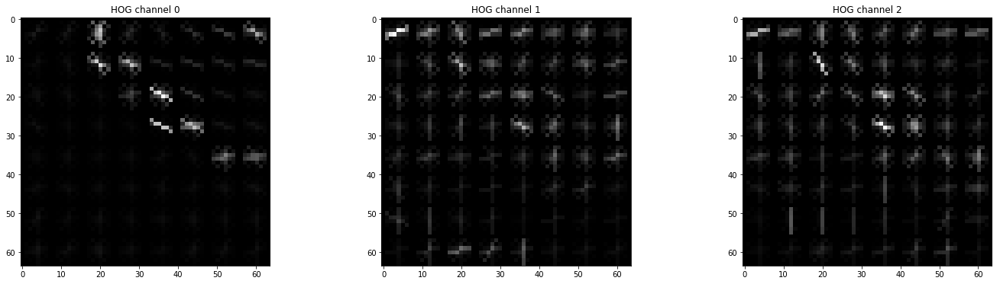

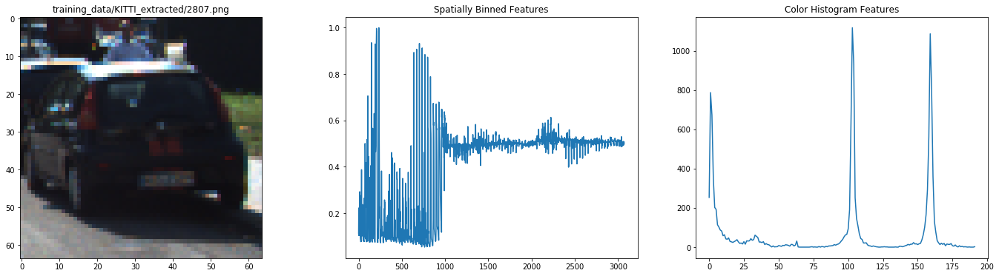

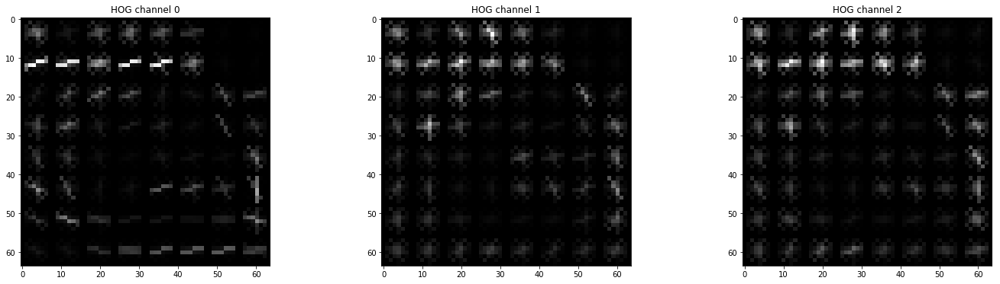

...

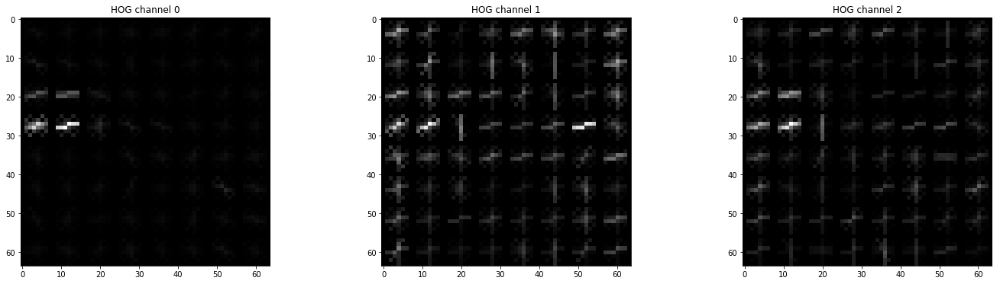

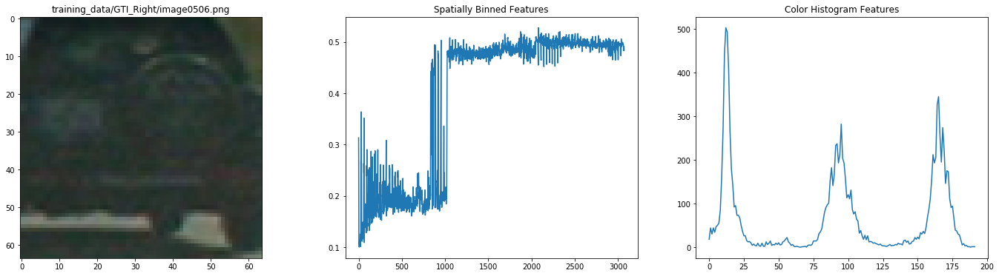

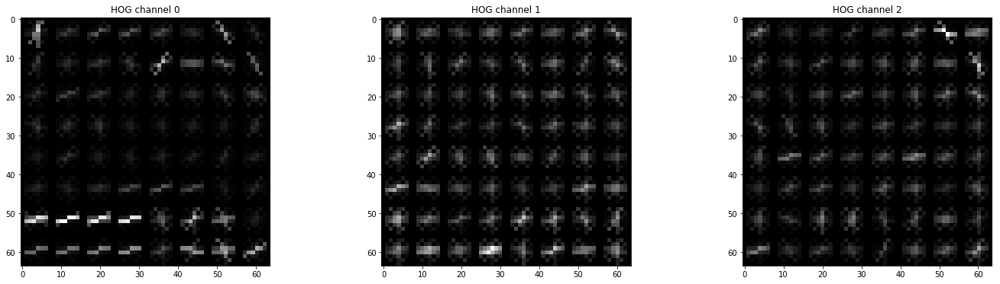

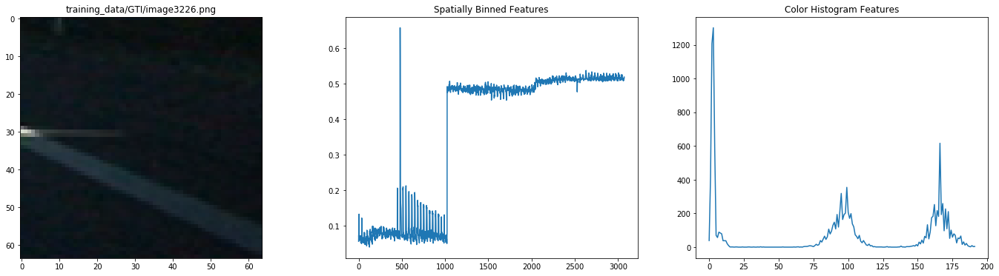

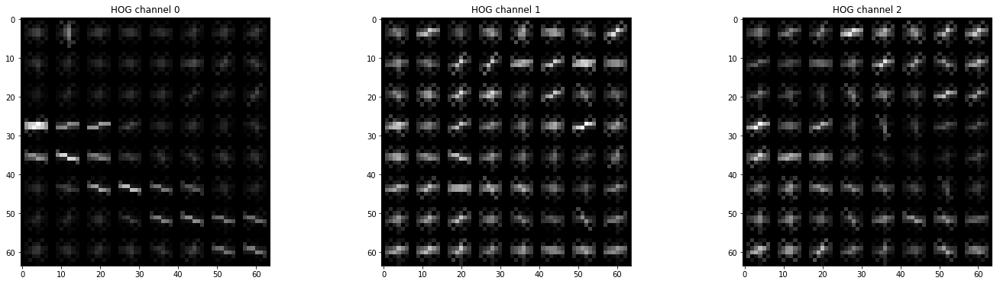

In [28]:
##################################################################################
#
# Print 3 random cars and non cars from data-set
#
#################################################################################

print ()
print ('NOTE: displaying feature images of random training car and non car examples')
print ()

for i in range (3) :
    plot_details(car_list[car_ex[i]])
    plot_details(non_car_list[car_ex[i]])
    

### 8. Normalize extrated Features

In [9]:
#################################################################################
#
# Normalize the training data and generate labels
#
#################################################################################

from sklearn.preprocessing import StandardScaler

# normalize training data
X = np.vstack((car_features, non_car_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# labels
y = np.hstack((np.ones(len(car_features)), np.zeros(len(non_car_features))))

### 9. Split Features into Training and Test data-set

In [95]:
#################################################################################
#
# Split into training and test data-set
#
#################################################################################

from sklearn.model_selection import train_test_split

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)

### 10. Train Model / Classifier

In [96]:
#################################################################################
#
# Train the SVC model and report 
#
#################################################################################

from sklearn.svm import LinearSVC
import time

# Use a linear SVC 
svc = LinearSVC()

# Check the training time for the SVC
t1 =time.time()
svc.fit(X_train, y_train)
t2 = time.time()

print ()
print ('NOTE:',round(t2-t1, 2),'seconds to train SVC')

# Check the score of the SVC
print('NOTE: training accuracy of SVC = ', round(svc.score(X_train, y_train), 4))
print('NOTE: test     accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
print ()

# Check the prediction performance for a single sample
t1=time.time()
n_predict = 10
print('NOTE: SVC sample predicts: ', n_predict)
print('NOTE: predition hitrate')
print('      predicted:',svc.predict(X_test[0:n_predict]))
print('      labels:   ',y_test[0:n_predict])
t2 = time.time()
print('NOTE:',round(t2-t1, 5),'seconds to predict for', n_predict,'labels with SVC')
print ()


NOTE: 43.35 seconds to train SVC
NOTE: training accuracy of SVC =  1.0
NOTE: test     accuracy of SVC =  0.9927

NOTE: SVC sample predicts:  10
NOTE: predition hitrate
      predicted: [ 1.  1.  0.  1.  1.  1.  1.  0.  0.  0.]
      labels:    [ 1.  1.  0.  1.  1.  1.  1.  0.  0.  0.]
NOTE: 0.02062 seconds to predict for 10 labels with SVC



### 11. Sliding Window Functions

In [497]:
#################################################################################
#
# Draw boxes function of lectures
#
#################################################################################

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

#################################################################################
#
# Scan image using search windows to identfiy vehicles based on sliding window
# implemetation of lectures
# 
# Input:     window_list    = pointer to rectangle list of found vehicles
#            img            = model for searching
#            xstart         = x position to start search
#            xstop          = x position to stop search
#            ystart         = y position to start search
#            ystop          = y position to stop search
#            svc            = model for prediction 
#            X_scaler       = scaler for normalization input data
#            orient         = hog paramter
#            pix_per_cell   = hog parameter
#            cell_per_block = hog paramter
#            spatial _size  = spatial parameter
#            hist_bins      = bins of color histogram
#            debug          = default 0, >0 debug messages >1 outputs search grid + matches
# Ouput:     draw_img       = images which contains matches + search grid if debug == 2
#            hits, skipped  = # idenfied cars, # of skipped identified cars because of ROI 
#
# NOTE:      does only for RGB to YCrCb color conversion
#
#################################################################################

def find_cars(window_list, img, xstart, xstop, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, filter2 =False, x_filter=0, y_filter=0, debug=0):
    
    hit = 0
    skipped = 0
    
    # ONLY needed if img from jpg
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch    = img[ystart:ystop,xstart:xstop,:]
    ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    if (debug > 0) :
        print ('DEBUG: blocks x, y',nxblocks, nyblocks)
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step orig 2
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    #print (nxsteps, nysteps, nblocks_per_window)
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    

    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop  = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features    = color_hist(subimg, nbins=hist_bins)
            
            # plot search area
            if (debug==2) :
                xbox_left = np.int(xleft*scale)+xstart
                ytop_draw = np.int(ytop*scale)
                win_draw  = np.int(window*scale)
                # Extra 2nd filter (for scale 1.5) - can be implemented better
                if filter2==True and ytop_draw+ystart < y_filter and xbox_left < x_filter :
                    cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,255,0),2) 
                else :
                    cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,255,0),2)
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                
                xbox_left = np.int(xleft*scale)+xstart
                ytop_draw = np.int(ytop*scale)
                win_draw  = np.int(window*scale)
                
                # Extra 2nd filter (for scale 1.5) - can be implemented better
                if filter2==True and ytop_draw+ystart < y_filter and xbox_left < x_filter :
                    skipped += 1    
                else :                                                                              
                    hit += 1
                    window_list.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                    #cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                
    return draw_img, hit, skipped    

### 12. Vehicle Search Function

In [501]:
#################################################################################
#
# Runs multiple search windows on image to identfiy vehicles
# 
# Input:     img      = model for searching
#            svc      = model for prediction 
#            X_scaler = scaler for normalization input data
#            orient   = hog paramter
#            pix_per_cell = hog parameter
#            cell_per_block = hog paramter
#            spatial _size = spatial parameter
#            hist_bins  = bins of color histogram
# Ouput:     rectangle list of found vehicles
#
# Calls:     find_cars()
#
#################################################################################

def search_multiple (img, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins) :
   
    hit1, hit2, hit3  = 0, 0, 0
    skip1, skip2, skip3 = 0, 0, 0
    dbg = 0
    
    windows = []
    
    img1, hit1, skip1 = find_cars(windows,img,  450, 1280, 400, 500, 1.0, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,debug=dbg)
    img2, hit2, skip2 = find_cars(windows,img,  450, 1280, 400, 510, 1.1, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,debug=dbg)
    img3, hit3, skip3 = find_cars(windows,img,  220, 1280, 400, 650, 1.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,filter2=True,x_filter=400,y_filter=500,debug=dbg)
    img4, hit4, skip4 = find_cars(windows,img,  450, 1280, 400, 650, 2.0, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,debug=dbg)
    
    if (dbg > 0) :
        print ('NOTE: hit  rate',hit1,hit2,hit3,hit4)
        print ('NOTE: skip rate',skip1,skip2,skip3,skip4)
    
    if (dbg >1) :
        plt.imshow(img1)
        plt.title('Scale Grid 1.0')
        plt.show()
    
        plt.imshow(img2)
        plt.title('Scale Grid 1.1')
        plt.show()
        
        plt.imshow(img3)
        plt.title('Scale Grid 1.5')
        plt.show()
        
        plt.imshow(img4)
        plt.title('Scale Grid 2.0')
        plt.show()
    
    return windows

### 13. Run Vehicle Search on Test Images

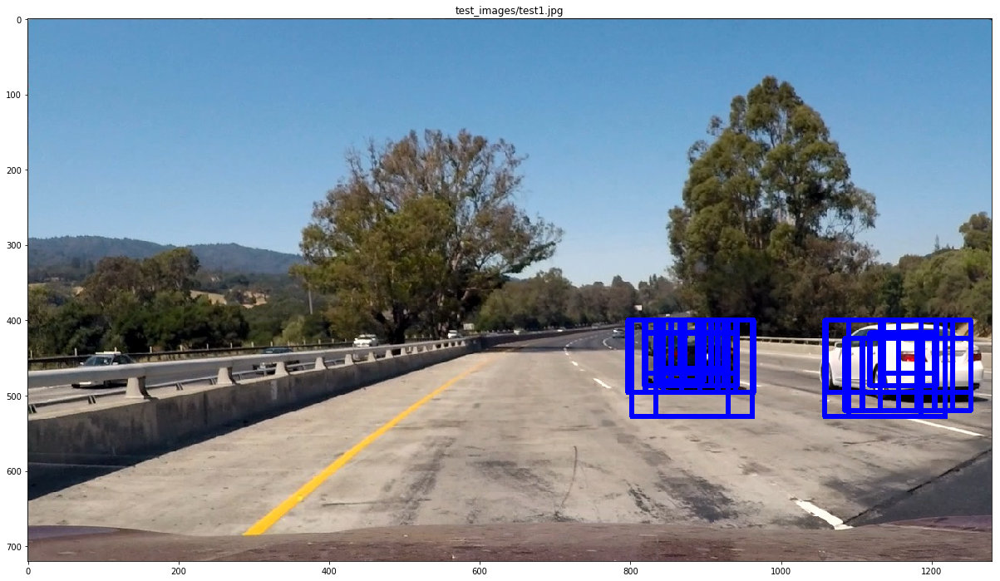

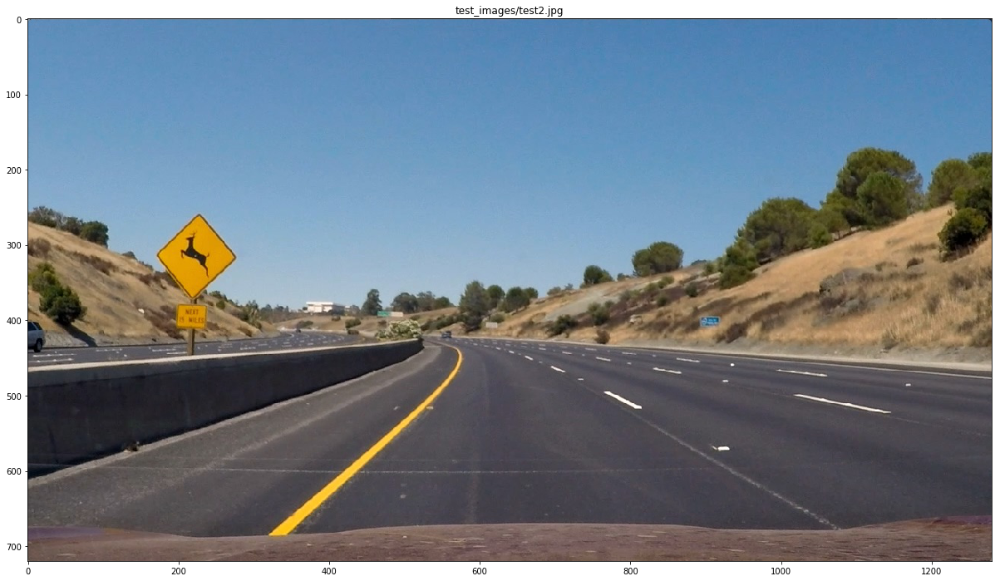

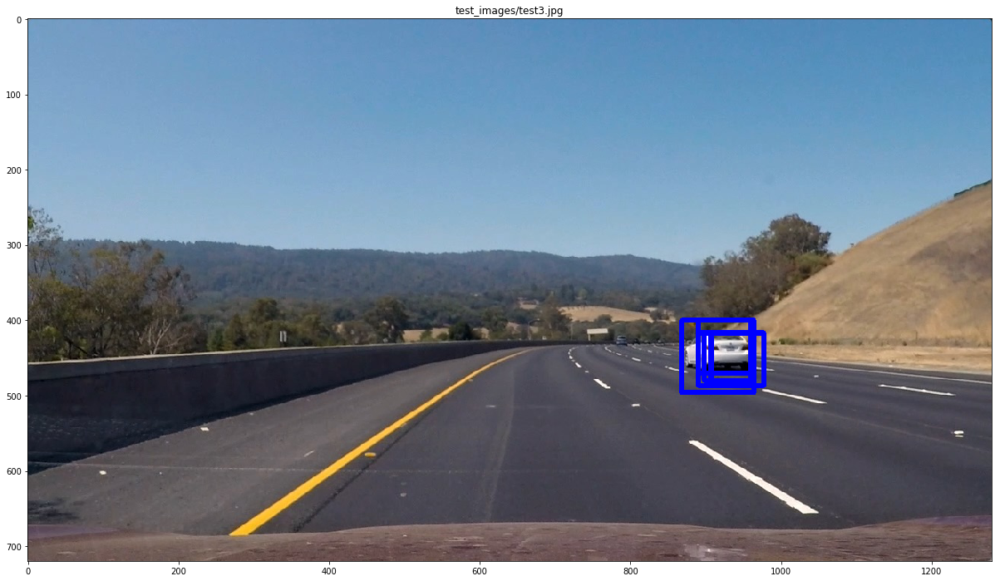

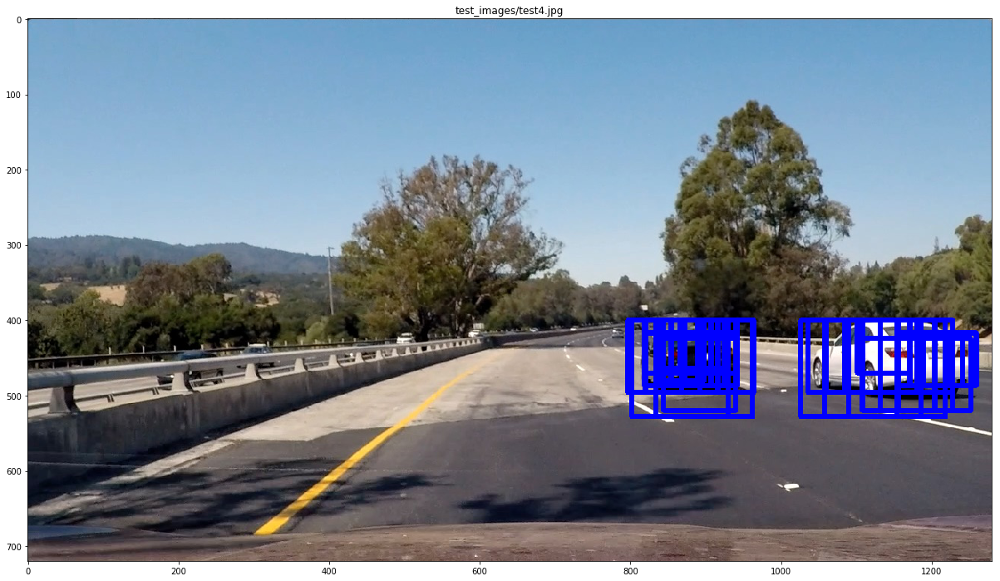

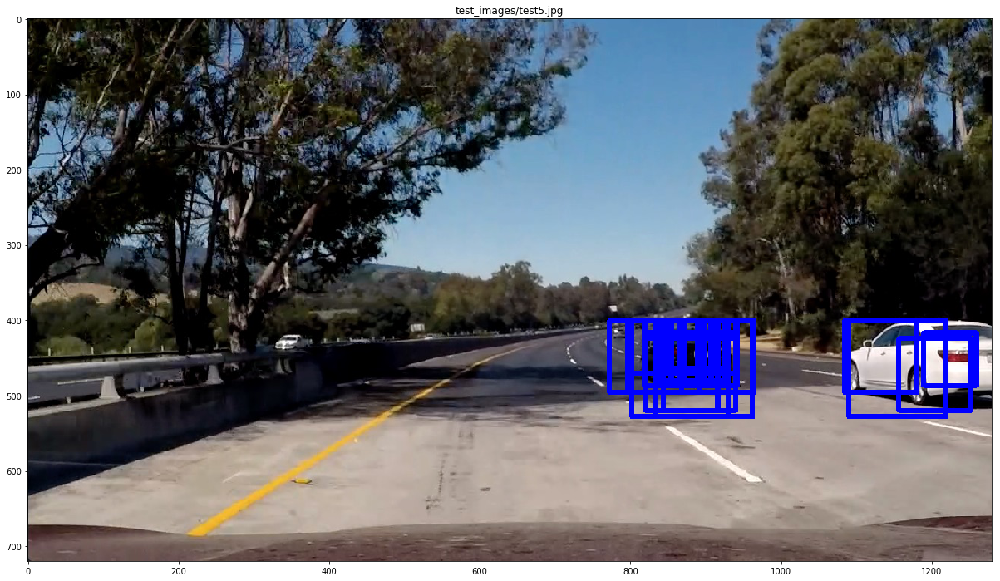

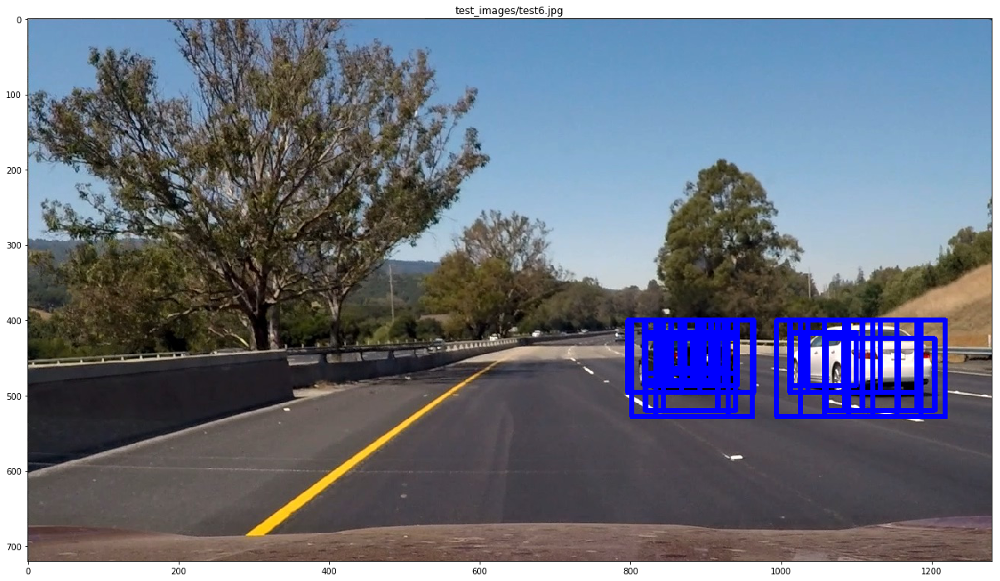

In [502]:
#################################################################################
#
# Test suite vehicle search on test images 
#
#################################################################################

# read test images
images = glob.glob('test_images/test*.jpg')


for fname in images :
    
    img = mpimg.imread(fname)
    # get hits
    wlist = search_multiple(img, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    # draw hits    
    out = draw_boxes(img, wlist, color=(0, 0, 255), thick=6)
    plt.imshow(out)
    plt.title(fname)
    plt.show()

### 14. Heatmap, thresholding & Label Functions

In [301]:
#################################################################################
#
# Functions for heat map and box labels as defined in the lectors with small 
# modifications
#
# Functions:     add_heat
#                apply_threshold
#                draw_labeled_bboxes
#
#################################################################################

from scipy.ndimage.measurements import label

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
    # Return updated heatmap
    return heatmap 
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    #rint ('labels',labels[1])
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        # Before drawing check last ones
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

### 15. Circular Buffer

In [424]:
#################################################################################
#
# Circular buffer for detection pipeline 
#
#################################################################################

import collections

CBUF = 10
hit_list    = collections.deque(maxlen=CBUF)

### 16. Detection Pipeline Video

In [513]:
#################################################################################
#
# Runs the vehicle detection pipeline using a circular buffer of size CBUF
# 
# Input:     threshold = threshold of heat map
#            image     = image to process
#            svc       = model for prediction
#            X_scaler  = scaler for normalization input data
#            orient    = hog paramter
#            pix_per_cell   = hog parameter
#            cell_per_block = hog paramter
#            spatial _size  = spatial parameter
#            hist_bins      = bins of color histogram
# Ouput:     draw_img       = image processed
#            heatmap        = heatmap image
#            labels[1]      = identified vehicles
#
# Global:    hit_list       = circular buffer containing the searches of CBUF x times
#
#################################################################################

def detectPipeLine_ (threshold, image, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins) :
    
    global hit_list
    
    # 1. search for objects
    box_list = search_multiple (image, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    #   add box_list to circular buffer
    hit_list.append(box_list)
    
    # 2. if buffer full run heatmap & labeling 
    if (len(hit_list)==CBUF) :
        # 2.0 heat map    
        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        # 2.1 Add heat to each box in box list
        for box in hit_list : 
            heat = add_heat(heat,box)
        # 2.3 Apply threshold to help remove false positives
        heat = apply_threshold(heat,threshold)
        # 2.4 Visualize the heatmap when displaying    
        heatmap = np.clip(heat, 0, 255)
        # 2.5 Find final boxes from heatmap using label function
        labels = label(heatmap)
        draw_img = draw_labeled_bboxes(np.copy(image), labels)
    
        return draw_img, heatmap, labels[1]
    
    else :
        return None, None, 0

    
    
def detectPipeLine_combined (threshold, image, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins) :
    
    global hit_list
    
    # 1. search for objects
    box_list = search_multiple (image, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    #   add box_list to circular buffer
    hit_list.append(box_list)
    
    # 2. if buffer full run heatmap & labeling 
    if (len(hit_list)==CBUF) :
        # 2.0 heat map    
        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        # 2.1 Add heat to each box in box list
        for box in hit_list : 
            heat = add_heat(heat,box)
        # 2.3 Apply threshold to help remove false positives
        heat = apply_threshold(heat,threshold)
        # 2.4 Visualize the heatmap when displaying    
        heatmap = np.clip(heat, 0, 255)
        # 2.5 Find final boxes from heatmap using label function
        labels = label(heatmap)
        #draw_img = draw_labeled_bboxes(np.copy(image), labels)
    
        return True, labels
    
    else :
        return False, None



### 17. Detection Pipeline Standalone

In [260]:
#################################################################################
#
# Runs the vehicle detection pipeline 
# 
# Input:     threshold = threshold of heat map
#            image     = image to process
#            svc       = model for prediction
#            X_scaler  = scaler for normalization input data
#            orient    = hog paramter
#            pix_per_cell   = hog parameter
#            cell_per_block = hog paramter
#            spatial _size  = spatial parameter
#            hist_bins      = bins of color histogram
# Ouput:     draw_img       = image processed
#            heatmap        = heatmap image
#            labels[1]      = identified vehicles
#
#################################################################################

def detectPipeLine (threshold, image, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins) :
    
    global hit_list
    
    # 1. search for objects
    box_list = search_multiple (image, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)    
   
    # heat map    
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    
    # 2. Add heat to each box in box list   
    heat = add_heat(heat,box_list)
    # 3. Apply threshold to help remove false positives
    heat = apply_threshold(heat,threshold)
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)
    # 4. Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)
    
    return draw_img, heatmap, labels


### 18. Run Full Detection Pipeline on Test Images

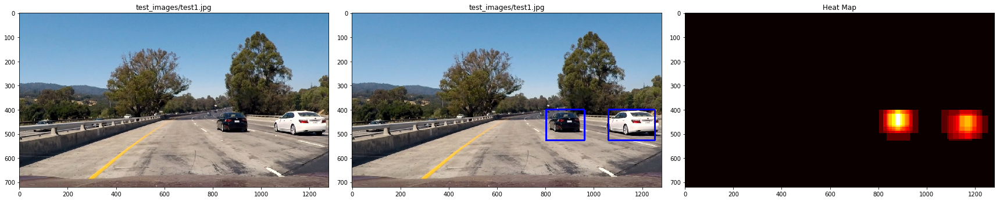

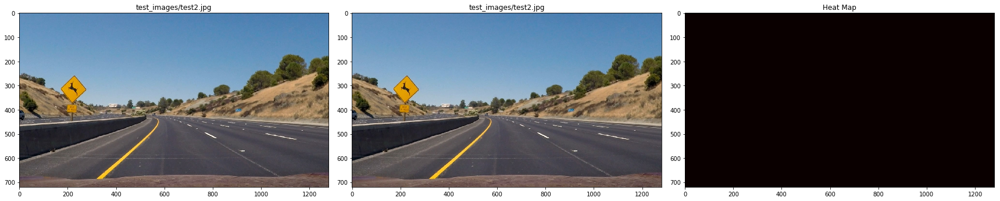

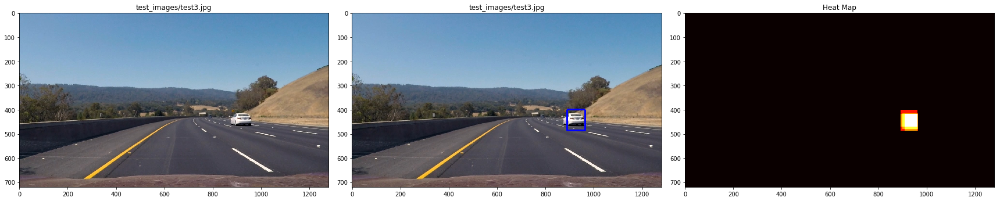

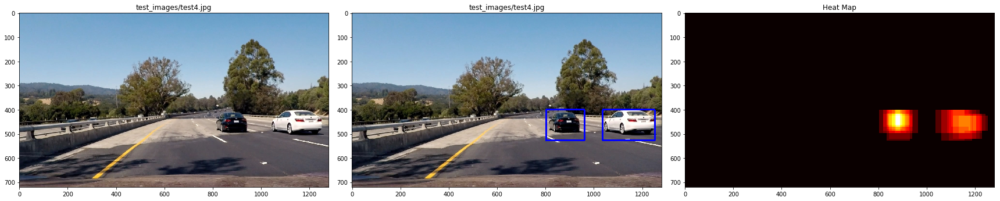

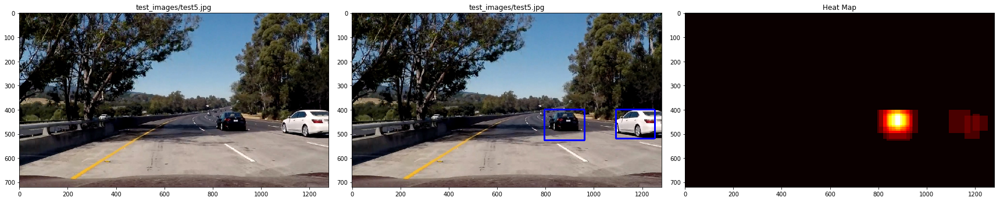

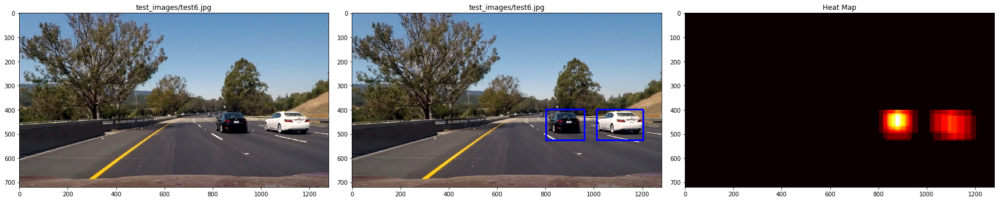

In [526]:
#################################################################################
#
# Test Suite for detection pipeline
#
#################################################################################

images = glob.glob('test_images/test*.jpg')

for fname in images :
    
    image = mpimg.imread(fname)
    
    output, heatmap, hits = detectPipeLine (1, image, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    
    fig = plt.figure()
    plt.subplot(131)
    plt.imshow(image)
    plt.title(fname)
    plt.subplot(132)
    plt.imshow(output)
    plt.title(fname)
    plt.subplot(133)
    plt.imshow(heatmap, cmap='hot')
    plt.title('Heat Map')
    fig.tight_layout()
    

### 19. Project Video 

In [489]:
#################################################################################
#
# Video setup - execute always
#
#################################################################################

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

number = 0
hit_list.clear()

In [490]:
#################################################################################
#
# Video Fucntion contains detection pipeline
#
#################################################################################

def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    global number
    
    number = number + 1
   
    ########################################################
    # Run pipeline for videos comment out/in according video
    ######################################################## 
    output, heatmap, hit = detectPipeLine_ (CBUF-1, image, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    
    # add image number
    pic_index   = "image: %i" % ( number )
    hit_index   = "cars detected: %i" % ( hit )
    
    if (output == None) :
        output = np.copy(image)
    
    # comment out for submission
    #cv2.putText(output,pic_index,  (10,50), cv2.FONT_HERSHEY_DUPLEX,  1,  (255,255,255) )
    #cv2.putText(output,hit_index,  (10,90), cv2.FONT_HERSHEY_DUPLEX,  1,  (255,255,255) )
  
    #if (number > 1030 and number < 1050) :
    #    img_dbg = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    #    Sname = "./missing_new/out%i.jpg" % (number)
    #    cv2.imwrite(Sname, img_dbg)

    return output

In [491]:
white_output = 'project_video_output_final.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_output_final.mp4
[MoviePy] Writing video project_video_output_final.mp4


100%|█████████▉| 1260/1261 [16:53<00:00,  1.15it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_final.mp4 

CPU times: user 15min 30s, sys: 1min 23s, total: 16min 53s
Wall time: 16min 55s


## Added P4 Project Files for Challenge - ingnore if not iteressted

In [263]:
import csv
import cv2
import numpy as np
import sklearn
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline

In [264]:
#################################################################################
#
# runCalibration: generate object and image lists for camera calibration based
#                 on jpg files stored in direction
# inputs:         location = directory where calibration files are stored
#                 nx = number of chess corners in x direction
#                 ny = number of chess corners in y direction
#                 debug = enables debug 0 = no debug, 1 = verbal, 2 = images are 
#                 printed
# outputs:        obj and image list for chess corners as np.array
#
#################################################################################

def runCalibration (location, nx, ny, debug = 0) :
    
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    ref_ob       = np.zeros((nx*ny,3), np.float32)
    ref_ob[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
    
    # Arrays to store object points and image points from all the images.
    obj_l   = [] # 3d point in real world space
    img_l   = [] # 2d points in image plane.

    # get calibartion files
    images = glob.glob(location)
    
    for fname in images :
        
        # Read & gray scale
        image = mpimg.imread(fname)
        gray  = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        
        #plt.title('Distorted Image')
        #plt.imshow(image)
        #plt.show()
        
        if (debug == 1) :
            print ('** debug: processing file',fname)
        
        # Find the chess board corners
        ret, corners = cv2.findChessboardCorners(gray,(nx,ny),None)

        # Check if found
        if ret == True :
            obj_l.append(ref_ob)
            img_l.append(corners)
            
            if (debug > 0) :
                print ('** debug: chess corners recognized for file',fname)
            
            if (debug == 2) :
                # plot images
                plt.rcParams["figure.figsize"] = [15, 5]
                sub = plt.subplot(1,2,1)
                plt.title('Distorted Image')
                plt.imshow(image)
                cv2.drawChessboardCorners(image, (nx,ny), corners, ret)
                sub = plt.subplot(1,2,2)
                plt.title('Distorted Image with identified corners')
                plt.imshow(image)
                plt.show()
            
         
    if (len(obj_l) < len(images)) :
        print()
        print('NOTE: not all chess corners have been identified: identified images',len(obj_l),'of',len(images))
        print()
        
    return np.array(obj_l), np.array(img_l)

In [265]:
#################################################################################
#
# runUndistort:   undistort image
# inputs:         name = name of image file
#                 ojb = ref. obj coordinates of chess corners
#                 img = image coordinates of chess corners
#                 debug = enables debug 0 = no debug, 1 = verbal, 2 = images are 
# outputs:        undistorted image
#
#################################################################################

def runUndistort(name, obj, img, debug=0) :

    # Test undistortion on an image
    pic = mpimg.imread(name)
    im_size = (pic.shape[1], pic.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj, img, im_size,None,None)

    # check distortion
    dst = cv2.undistort(pic, mtx, dist, None, mtx)

    if debug > 0 :
        # plot
        plt.rcParams["figure.figsize"] = [15, 5]
        #pic  = cv2.cvtColor(pic, cv2.COLOR_BGR2RGB)
        sub = plt.subplot(1,2,1)
        plt.title('Original Image')
        plt.imshow(pic)
        sub = plt.subplot(1,2,2)
        plt.title('Undistorted Image')
        #dst  = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
        plt.imshow(dst)
        plt.show()
    
    return dst

In [266]:
#################################################################################
#
# sobel functions (from training sessions):  
#                                          abs_sobel_thresh
#                                          mag_thresh
#                                          dir_threshold
#
# inputs:         image in RGB
#                 ....
# outputs:        image in grayscale
#
#################################################################################

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(80, 255)):  
    
    # color convert 
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # set x or y
    if orient == 'x' :
        x=1
        y=0
    else :
        x=0
        y=1
    sobel = cv2.Sobel(gray,cv2.CV_64F,x,y)
    # absolute value of the derivative or gradient
    sobel_abs = np.absolute(sobel)
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    sobel_scaled = np.uint8(255*sobel_abs/np.max(sobel_abs))
    # Create a mask of 1's where the scaled gradient magnitude 
    binary_output = np.zeros_like(sobel_scaled)    
    # Apply threshold
    binary_output[(sobel_scaled >= thresh[0]) & (sobel_scaled <= thresh[1])] = 1
    # return
    return binary_output


def mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 100)):
    
    # color convert
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    # Calculate the magnitude 
    mag = (sobel_x**2 + sobel_y**2)**0.5
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    mag_scaled = np.uint8(255*mag/np.max(mag))
    # Create a mask of 1's where the scaled gradient magnitude 
    binary_output = np.zeros_like(mag_scaled)
    # Apply threshold
    binary_output[(mag_scaled >= mag_thresh[0]) & (mag_scaled <= mag_thresh[1])] = 1
    # return
    return binary_output
    
    
def dir_threshold(img, sobel_kernel=3, thresh=(0.7, 1.3)):
    # Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    # Take the absolute value of the x and y gradients
    mag = (sobel_x**2 + sobel_y**2)**0.5
    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(np.absolute(sobel_y),np.absolute(sobel_x))
    # Create a mask of 1's where the scaled gradient magnitude 
    binary_output = np.zeros_like(direction)
    # Apply threshold
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    # return
    return binary_output
   
#################################################################################
#
# color convertion functions (from training sessions):  
#                                          hls_select
# inputs:         image in RGB
#                 ....
# outputs:        image in grayscale
#
#################################################################################

def hls_select(img, thresh=(0, 255)):
    # Convert to HLS color space
    hls = cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    # Apply a threshold to the S channel
    S = hls[:,:,2]
    # Threshold 
    binary_output = np.zeros_like(S)
    binary_output[(S >= thresh[0]) & (S <= thresh[1])] = 1

    return binary_output

#################################################################################
#
# combined color convertion + sobel functions (from training sessions): 
#                                                    combinedSobelColor()
#                                                    combinedAdvanced()
#                                                    combinedAdvanced2() used !!
#                                          
# inputs:         image in RGB
#                 ....
# outputs:        binary image
#
#################################################################################


def combinedSobelColor (img, kernel=3, thresh_s=(20,100), thresh_c=(125,255)) :
  
    sxbinary = abs_sobel_thresh(img, orient='x', sobel_kernel=kernel, thresh=thresh_s)
    sbinary  = hls_select(img, thresh=thresh_c)

    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, sbinary))

    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(sbinary == 1) | (sxbinary == 1)] = 1

    return combined_binary



def combinedAdvanced(img, s_thresh=(155, 255), sx_thresh=(25, 155)):
    
    img = np.copy(img)
    
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    
    #return color_binary

    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    return combined_binary


def combinedAdvanced2(img, s_thresh=(155, 255), sx_thresh=(50, 255), l_thresh=(40,255)):
    
    img = np.copy(img)
    
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0,ksize=3) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Threshold lightness
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    #color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[((s_binary == 1) & (l_binary == 1)) | (sxbinary == 1)] = 1
    
    return combined_binary

In [267]:
#################################################################################
#
# functions used in P1 project:
#                                 region_of_interest()
#                                 filterlines()
#
#################################################################################

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def filterlines (lines, miny, maxy) :
    
    new_lines = []
    
    LTH       = -0.5
    RTH       =  0.5
    
    x1_lm     = 0
    y1_lm     = 0
    slope_lm  = 0
    num_l     = 0
    
    x1_rm     = 0
    y1_rm     = 0
    slope_rm  = 0
    num_r     = 0
    
    X1R       = 0
    X2R       = 0
    X1L       = 0
    X2L       = 0
    
    # go through all lines
    for line in lines :
        
        for x1,y1,x2,y2 in line :
            
            # Calculate slope
            slope = ((y2-y1)/(x2-x1)) 
            
            #print ('** slope',slope,'x1,y1',x1,y1,'x2,y2',x2,y2)
            
            # left slope
            if slope < LTH :
                
                # incr. left number
                num_l = num_l +1
                # mean values
                x1_lm    = x1_lm + x1 
                y1_lm    = y1_lm + y1 
                slope_lm = slope_lm + slope
                
            else :
                if slope > RTH :
                    
                    # incr. left number
                    num_r = num_r +1
                    # mean values
                    x1_rm    = x1_rm + x1 
                    y1_rm    = y1_rm + y1 
                    slope_rm = slope_rm + slope
                    
                else :
                    break
            
    # calulate 
    if num_l > 0 :
       # calculate mean     
        x1_lm    = int(x1_lm / num_l)
        y1_lm    = int(y1_lm / num_l)
        slope_lm = (slope_lm / num_l)
        #print ('left',x1_lm,y1_lm,slope_lm,num_l)
        # calculate x values
        X1L      = int (((maxy - y1_lm) / slope_lm ) + x1_lm)
        X2L      = int (((miny - y1_lm) / slope_lm ) + x1_lm)
    
    if num_r > 0 :
        # calculate mean
        x1_rm    = int(x1_rm / num_r)
        y1_rm    = int(y1_rm / num_r)
        slope_rm = (slope_rm / num_r)
        #print ('right',x1_rm,y1_rm,slope_rm,num_r)
        # calculate x values
        X1R      = int (((maxy - y1_rm) / slope_rm ) + x1_rm)
        X2R      = int (((miny - y1_rm) / slope_rm ) + x1_rm)
    
    return X1L, X2L, X1R, X2R

################################################################################
#
# Region parameters & Hough transformation parametere 
#
#################################################################################

def runPerspectiveMatrix (image, debug = 0) :
    
    # reference image shape
    imshape = image.shape
    # color covert
    image_p    = combinedSobelColor(image,thresh_s=(60,120), thresh_c=(155,255))

    # region variables
    VIEW_y  = 480        # max y value  # 480
    VIEW_l  = 400       
    VIEW_r  = 800
    MAX_y   = imshape[0] # height
    MIN_x   = 0
    MAX_x   = imshape[1] # width

    # set region
    region       = np.array([[(MIN_x,MAX_y),(VIEW_l, VIEW_y), (VIEW_r, VIEW_y), (MAX_x,MAX_y)]], dtype=np.int32)
    masked_edges = region_of_interest(image_p, region)

    # hough tranformation
    votes  = 40
    lines  = cv2.HoughLinesP(masked_edges, 1, (np.pi/180), votes, np.array([]), minLineLength=10, maxLineGap=10)

    # draw lines
    color=[255, 0, 0] 
    thickness=2

    # get coordinates
    x1, x2, x3, x4 = filterlines (lines, VIEW_y, MAX_y )

    line_img = np.zeros((image_p.shape[0], image_p.shape[1], 3), dtype=np.uint8)

    cv2.line(line_img, (x1, MAX_y),       (x2, VIEW_y), color, thickness)
    cv2.line(line_img, (x3, MAX_y),       (x4, VIEW_y), color, thickness)
    cv2.line(line_img, (x1, MAX_y),       (x3, MAX_y),  color, thickness)
    cv2.line(line_img, (x2, VIEW_y),      (x4, VIEW_y), color, thickness)

    # mkae copy of ref. images + add lines drawing
    img_c = np.copy(image)
    rst   = cv2.addWeighted(img_c, 0.7, line_img, 1.0, 0.0)
    
    # plot rst
    if (debug > 1) :
        plt.imshow(rst)
        plt.show()
        
        
    # generate matrix & warped image
    
    # set source and destination array
    src = np.array( [ (x1, MAX_y), (x2, VIEW_y), (x4, VIEW_y), (x3, MAX_y) ],np.float32) 
    dst = np.array( [ (x1, MAX_y), (x1, 0),      (x3, 0),      (x3, MAX_y) ],np.float32)

    # Matrix 
    M    = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)

    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(rst, M, (rst.shape[1],rst.shape[0]))
    
    # plot verification of warped image
    if (debug > 0) :
        
        print ("NOTE: SRC coordinates=")
        print (src)
        print ("NOTE: DST coordinates=")
        print (dst)
        print ("NOTE: lane width [pixels]=",x3-x1)
        
        plt.rcParams["figure.figsize"] = [24, 12]
        sub = plt.subplot(2,2,1)
        plt.title('Original')
        plt.imshow(rst)
        sub = plt.subplot(2,2,2)
        plt.title('Transformed Bird View')
        plt.imshow(warped) 
        plt.show()

    return M, Minv

In [268]:
#################################################################################
#
# laneDetectSlide:  searches full 2. poly. for left and right lanes using sliding 
#
# inputs:         image (binary)
#                 nwindow = number of windows to search
#                 margin  = x width for search @ each line
#                 minpix  = min. pixels in asearch window 
#                 ym_per_pix = y meter per pixel coefficient
#                 xm_per_pix = x meter per pixel coefficient
#                 debug = if bigger than 1 histogram, search plots will be displayed 
# 
# outputs:        2. poly. for left and right lane
#                 curve radius for left and right lane
#
#################################################################################

def laneDetectSlide (image, nwindows = 9, margin = 100, minpix = 50, ym_per_pix = 30/720, xm_per_pix = 3.7/900, debug = 0) :
    
    # get positions
    histogram   = np.sum(image[image.shape[0]//2:,:], axis=0)
    midpoint    = np.int(histogram.shape[0]/2)
    leftx_base  = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
     # window height to slide
    window_height = np.int(image.shape[0]/nwindows)
    
    # silding windows image - only needed if ploting enabled
    if (debug > 0) :
        out_img = np.dstack((image, image, image))*255     
    
    # x and y values
    nonzero  = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # start positions
    leftx_current  = leftx_base
    rightx_current = rightx_base
    
    # lane indexes
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low       = image.shape[0] - (window+1)*window_height
        win_y_high      = image.shape[0] -  window*window_height
        win_xleft_low   = leftx_current - margin
        win_xleft_high  = leftx_current + margin
        win_xright_low  = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image if enabled
        if (debug > 0) :
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    
        # Identify the nonzero pixels in x and y within the window
        good_left_inds  = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
      
    # flatten indexes
    left_lane_inds  = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx  = nonzerox[left_lane_inds]
    lefty  = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # plot 
    if (debug > 0) :
        
        # Generate x and y values for plotting
        ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
        left_fitx  = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        # Sliding window
        
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
       
        plt.rcParams["figure.figsize"] = [18, 9]
        # plot also histogram
        sub = plt.subplot(1,1,1)
        histogram = np.sum(image[image.shape[0]//2:,:], axis=0)
        plt.plot(histogram)   
        plt.show() 
        
        # sliding 
        plt.rcParams["figure.figsize"] = [18, 9]
        sub = plt.subplot(1,1,1)
        plt.title('Lane Detection - Sliding Approach')
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show() 
        
        # detected lines
        ub = plt.subplot(1,1,1)
        plt.title('Detected Lanes')
        plt.imshow(image,cmap = 'gray')
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
       
       
    # calculate radius
    # Fit new polynomials to x,y in world space
    left_fit_cr  =  np.polyfit(lefty  * ym_per_pix, leftx  * xm_per_pix, 2)
    right_fit_cr =  np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad  = ((1 + (2*left_fit_cr[0] * 719*ym_per_pix + left_fit_cr[1])**2)**1.5) /  np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]* 719*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    
    return left_fit, right_fit, left_curverad, right_curverad

#################################################################################
#
# laneDetectReuse:  searches full 2. poly. for left and right lanes using last poly 
#
# inputs:         image (binary)
#                 left_fit, right_fit = last 2. poly. for left and right lane
#                 nwindow = number of windows to search
#                 margin  = x width for search @ each line
#                 ym_per_pix = y meter per pixel coefficient
#                 xm_per_pix = x meter per pixel coefficient 
# 
# outputs:        2. poly. for left and right lane
#                 curve radius for left and right lane
#
#################################################################################

def laneDetectReuse (image, left_fit, right_fit, margin = 100,ym_per_pix = 30/720, xm_per_pix = 3.7/900) :
    
    # get pix
    nonzero =  image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # search
    left_lane_inds  =  ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin))) 
    
    # Again, extract left and right line pixel positions
    leftx  = nonzerox[left_lane_inds]
    lefty  = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit  = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # calculate radius
    # Fit new polynomials to x,y in world space
    left_fit_cr  =  np.polyfit(lefty  * ym_per_pix, leftx  * xm_per_pix, 2)
    right_fit_cr =  np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad  = ((1 + (2*left_fit_cr[0] * 719*ym_per_pix + left_fit_cr[1])**2)**1.5) /  np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]* 719*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_fit, right_fit, left_curverad, right_curverad

################################################################################
#
# centerOffset_m: cal. vehicle position versus image center 
#
# inputs:         left_fit, right_fit = last 2. poly. for left and right lane
#                 width = image width
#                 height = image height
#                 xm_per_pix = x meter per pixel coefficient
# outputs:        position in meters
#
#################################################################################

def centerOffset_m (left_fit, right_fit, width=1280, height=720, lane_mp=3.7/900) :

    xl =  left_fit[0]*height**2 +  left_fit[1]*height + left_fit[2]
    xr = right_fit[0]*height**2 + right_fit[1]*height + right_fit[2]

    lane_center = (xr+xl)/2
    pic_center  =  width/2
    offset      =  lane_center - pic_center
        
    return offset * lane_mp

#################################################################################
#
# unWarp:   unwarps warp image and generates image with lane detection area 
#
# inputs:   image = orig. image (color) 
#           warp  = warped image
#           Minv  = inverse Matrix for unwarping
#           left_fit, right_fit = last 2. poly. for left and right lane
#
# outputs:  image with lane detection area
#
#################################################################################

def drawLaneArea(image, warp, Minv, left_fit, right_fit ) :

    # plot pixels
    ploty = np.linspace(0, warp.shape[0]-1, warp.shape[0] )
    left_fitx  = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    warp_zero  = np.zeros_like(warp).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left  = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 

    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
        
    return result

In [275]:
#################################################################################
#
# pipeLine: main processing pipeline 
#
# inputs:   image = orig. image (color) 
#           Minv  = Matrix & inverse Matrix for warping
#           obj_l, img_l = chessboard corner list for ref. and image (used for undistort)
#           number = image number
#           debug = if enbale plots results
#
# NOT USED
# globals   reset = if asserted == 1: only laneDetectionSlide runs for detection
#           before_left_fit_buf, before_right_fit_buf 0 circular buffer for saving poly. results
#           before_left_fit, before_right_fit = last ploy fit for left and right lane
#
# outputs:  image prcessed after lane detection
#
#################################################################################

import collections

before_left_fit  = None
before_right_fit = None

reset = 1

before_left_fit_buf  = collections.deque(maxlen=10)
before_right_fit_buf = collections.deque(maxlen=10)


def pipeLine(image, M, Minv, obj_l, img_l, number, debug = 0) :
    
    global before_left_fit_buf
    global before_right_fit_buf
    global before_left_fit
    global before_right_fit
    global reset
    
    if (number == 1) :
        print ('NOTE: combinedAdvanced2(image_und,s_thresh=(155, 255), sx_thresh=(35, 255), l_thresh=(40,255)) ')
   
    # 1. undistort image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_l, img_l, (image.shape[1], image.shape[0]),None,None)
    image_und                    = cv2.undistort(image, mtx, dist, None, mtx)
    
    # 2. image pre-process  3
    warped_ = combinedAdvanced2(image_und,s_thresh=(155, 255), sx_thresh=(35, 255), l_thresh=(40,255)) 
  
    
    # 3. warp image
    warped_pre    = cv2.warpPerspective(warped_, M, (image.shape[1],image.shape[0]))
    
    # show steps 2. & 3.
    if (debug > 0) :
        
        plt.rcParams["figure.figsize"] = [24, 12]
        sub = plt.subplot(2,2,1)
        plt.title('Pre-processed Image')
        plt.imshow(warped_,cmap='gray')
        sub = plt.subplot(2,2,2)
        plt.title('Binary Warped Image')
        plt.imshow(warped_pre,cmap='gray')
        plt.show()
        
    
    # 4. lane detection
    
    if (reset == 1) :
        # last one was bad - therefore sliding approach or always 
        print ('NOTE: reset @ frame =',number)
        left_fit_, right_fit_, curve_left_, curve_right_ = laneDetectSlide(warped_pre,margin = 100, debug = debug)
    else :
        left_fit_, right_fit_, curve_left_, curve_right_ = laneDetectReuse(warped_pre,before_left_fit,before_right_fit,margin = 100)
    
    
    # Sensivity check 1 
    if left_fit_ == None or right_fit_ == None :
        print ('FATAL: no lane detected @ frame =',number)
        reset = 1
        left_fit_  = sum(before_left_fit_buf)/len(before_left_fit_buf)
        right_fit_ = sum(before_right_fit_buf)/len(before_left_fit_buf)
    
    # senitiy check: check that the lane width (900 pixels) is between */- 12% 
    x_pos_left     =  left_fit_[0]*719**2 +  left_fit_[1]*719 + left_fit_[2]
    x_pos_right    = right_fit_[0]*719**2 + right_fit_[1]*719 + right_fit_[2]
    lane_width_cal = x_pos_right - x_pos_left 
  
    if (lane_width_cal < 765 or lane_width_cal > 1035) :  
        print ('NOTE: lane width issue =',lane_width_cal,'@ frame =',number)
        left_fit_  = sum(before_left_fit_buf)/len(before_left_fit_buf)
        right_fit_ = sum(before_right_fit_buf)/len(before_left_fit_buf)
        reset = 1
    else : 
        # save old value
        before_left_fit_buf.append(left_fit_)
        before_right_fit_buf.append(right_fit_)
        reset = 0 # if 1 only sliding apporach
    
    before_left_fit  = np.copy(left_fit_)
    before_right_fit = np.copy(right_fit_)
               
               
    # 5. draw lane 
    result_ = drawLaneArea(image_und, warped_pre, Minv, left_fit_, right_fit_)
    
    # 6. Add curve & centre info
            
    # add curve + offset info
    av = np.copy(np.abs(curve_right_ + curve_left_))
    radius = int(av / 2)
               
    curve_text  = "Curvature Radius:%6.im" %  ( radius )
    offset_text = "Vehicle Position:   %.3fm"  %  ( centerOffset_m (left_fit_, right_fit_) )
    
    #cv2.putText(result_,curve_text,    (100,100), cv2.FONT_HERSHEY_DUPLEX,  1,  (255,255,255) )
    #cv2.putText(result_,offset_text,   (100,140), cv2.FONT_HERSHEY_DUPLEX,  1,  (255,255,255) )
               
        
    return result_
    

### Execute

** debug: chess corners recognized for file ./camera_cal/calibration10.jpg


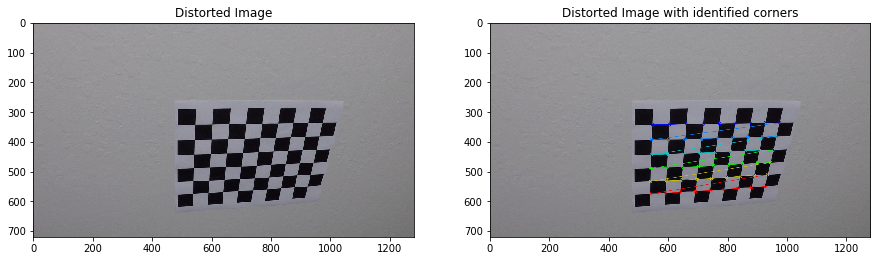

** debug: chess corners recognized for file ./camera_cal/calibration11.jpg


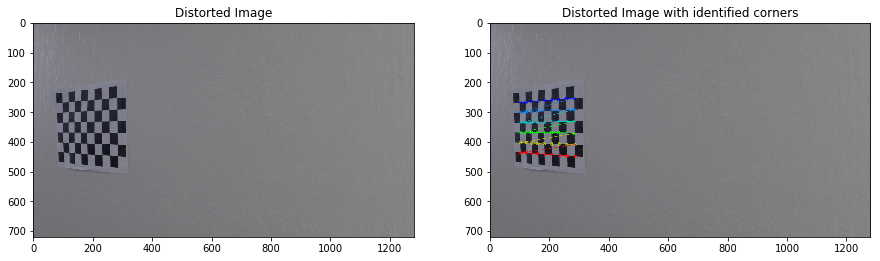

** debug: chess corners recognized for file ./camera_cal/calibration12.jpg


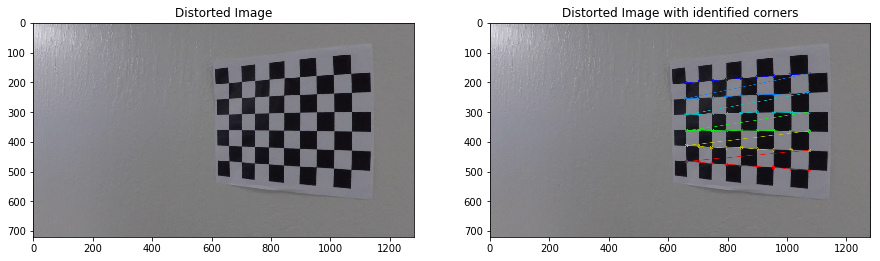

** debug: chess corners recognized for file ./camera_cal/calibration13.jpg


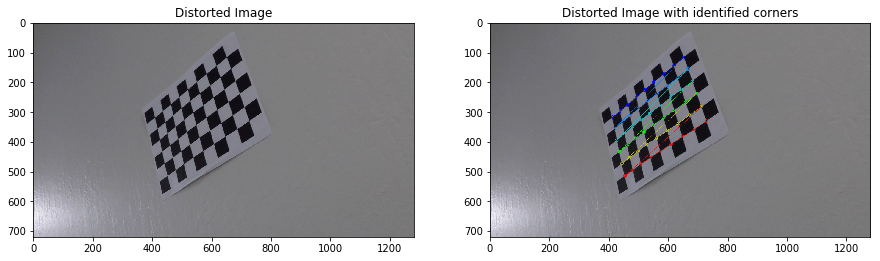

** debug: chess corners recognized for file ./camera_cal/calibration14.jpg


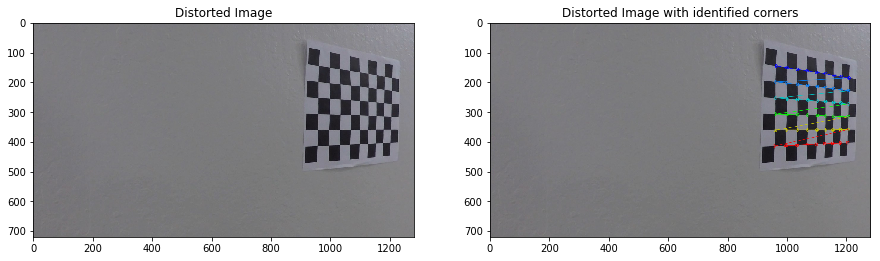

** debug: chess corners recognized for file ./camera_cal/calibration15.jpg


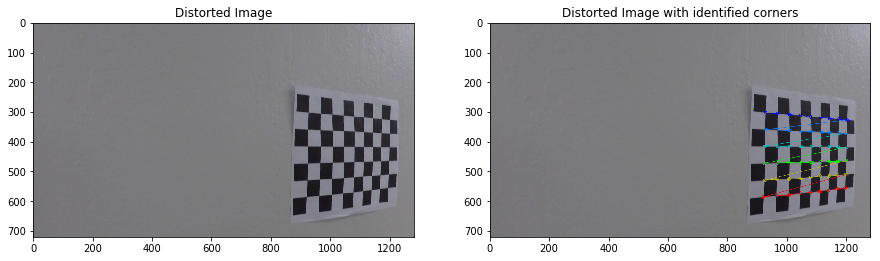

** debug: chess corners recognized for file ./camera_cal/calibration16.jpg


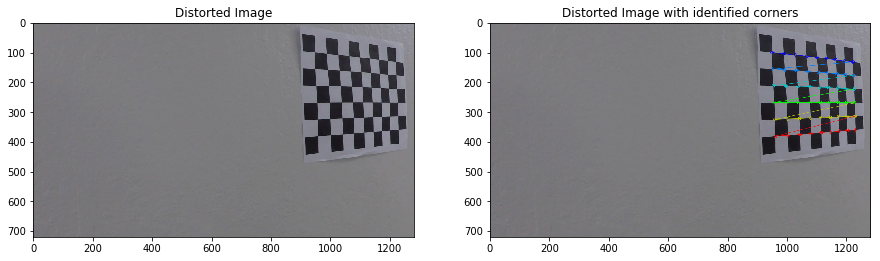

** debug: chess corners recognized for file ./camera_cal/calibration17.jpg


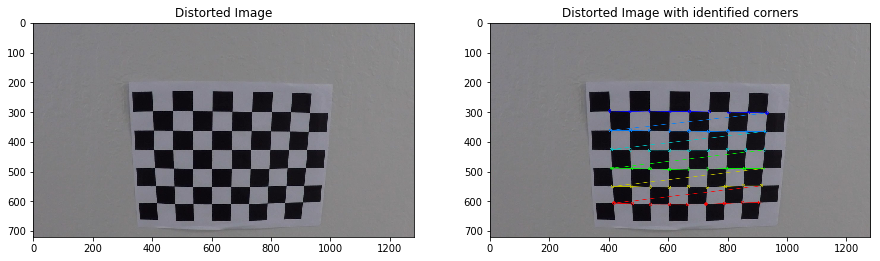

** debug: chess corners recognized for file ./camera_cal/calibration18.jpg


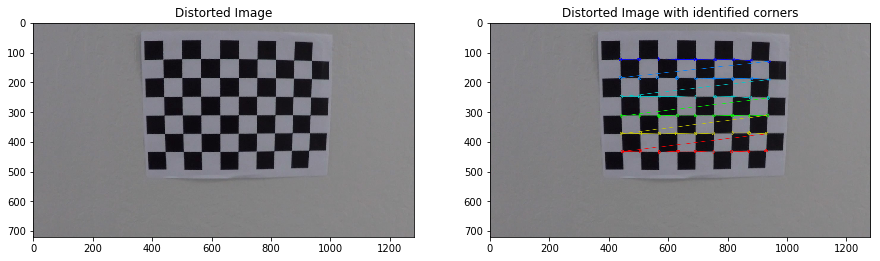

** debug: chess corners recognized for file ./camera_cal/calibration19.jpg


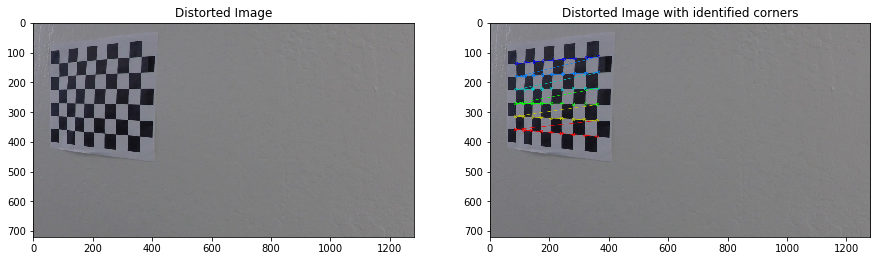

** debug: chess corners recognized for file ./camera_cal/calibration2.jpg


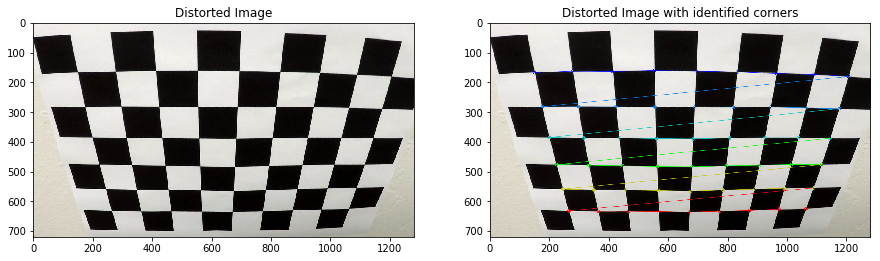

** debug: chess corners recognized for file ./camera_cal/calibration20.jpg


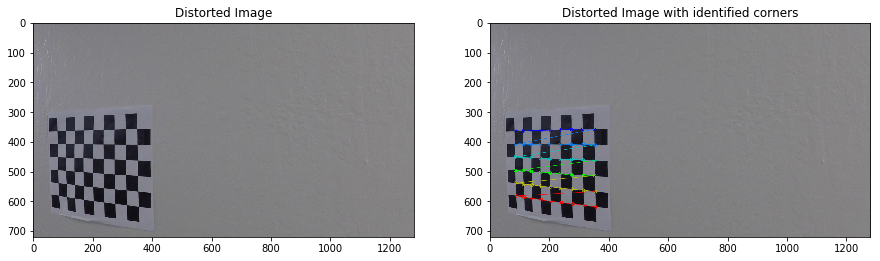

** debug: chess corners recognized for file ./camera_cal/calibration3.jpg


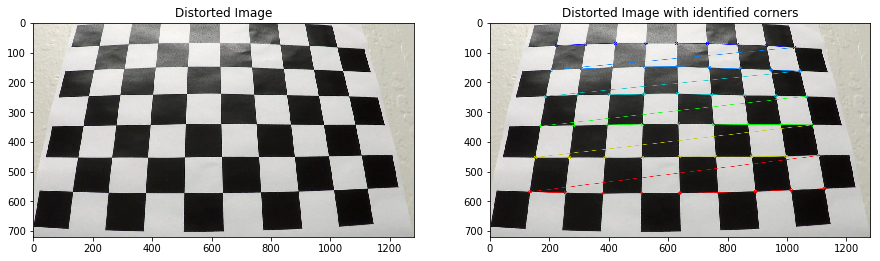

** debug: chess corners recognized for file ./camera_cal/calibration6.jpg


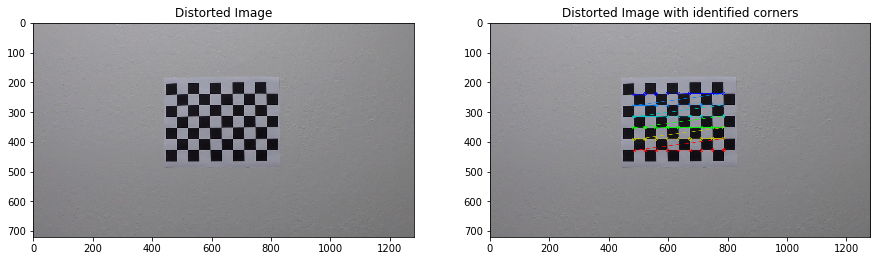

** debug: chess corners recognized for file ./camera_cal/calibration7.jpg


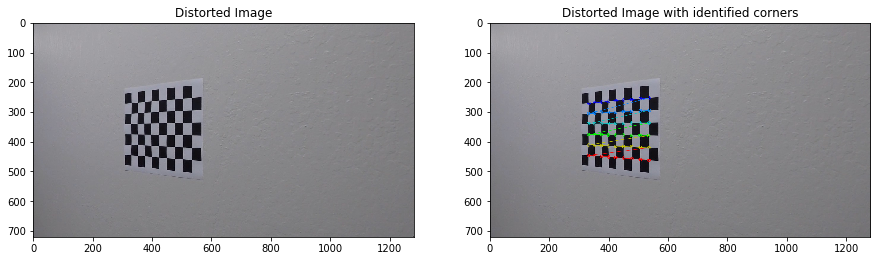

** debug: chess corners recognized for file ./camera_cal/calibration8.jpg


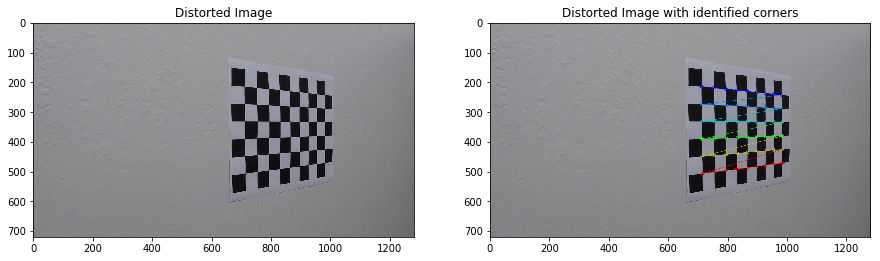

** debug: chess corners recognized for file ./camera_cal/calibration9.jpg


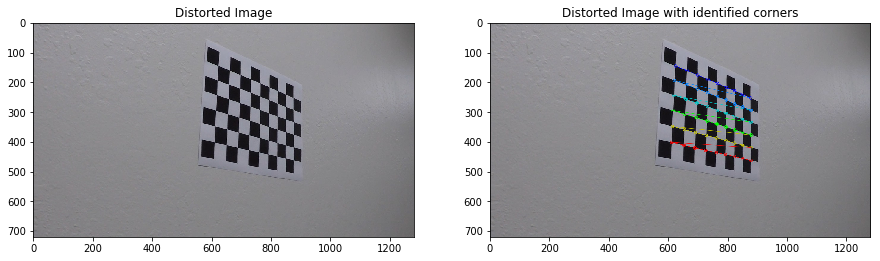


NOTE: not all chess corners have been identified: identified images 17 of 20



In [270]:
obj_l, img_l = runCalibration ("./camera_cal/*.jpg",9,6,2)

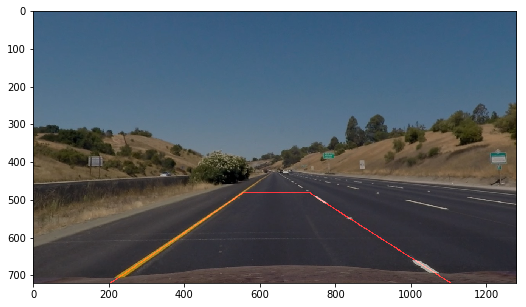

NOTE: SRC coordinates=
[[  204.   720.]
 [  556.   480.]
 [  730.   480.]
 [ 1105.   720.]]
NOTE: DST coordinates=
[[  204.   720.]
 [  204.     0.]
 [ 1105.     0.]
 [ 1105.   720.]]
NOTE: lane width [pixels]= 901


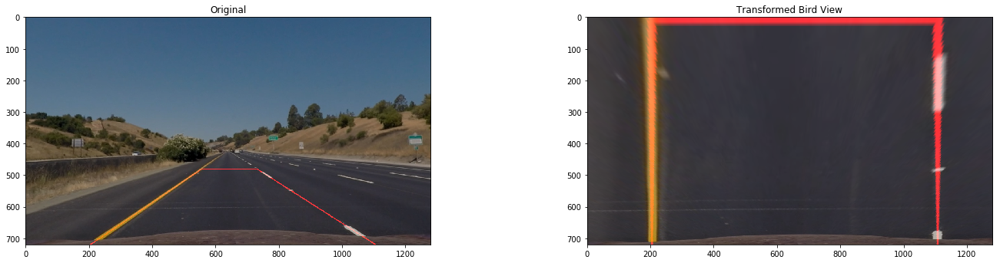

In [271]:
# Run Perspective matrix
m_image_und = runUndistort("./test_images/straight_lines1.jpg",obj_l,img_l, 0)
M, Minv = runPerspectiveMatrix(m_image_und,2)

### Video

In [514]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

number = 0
reset  = 1

hit_list.clear()

before_left_fit_buf.clear()
before_right_fit_buf.clear()

In [515]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    global number
    
    number = number + 1
    ########################################################
    # Run pipeline for videos comment out/in according video
    ########################################################
   
    # (1) Vehicle Detection
    valid, hit = detectPipeLine_combined (CBUF, image, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    
    # (2) Lane Detection
    output_ = pipeLine (image, M, Minv, obj_l, img_l,number)
    
    # (3) Add Vehicle Detection to Lane
    if (valid == False) :
        output_v = np.copy(output_)
    else :
        output_v = draw_labeled_bboxes(np.copy(output_), hit)
    
    return output_v

In [516]:
white_output = 'project_video_final_challenge.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

NOTE: combinedAdvanced2(image_und,s_thresh=(155, 255), sx_thresh=(35, 255), l_thresh=(40,255)) 
NOTE: reset @ frame = 1
[MoviePy] >>>> Building video project_video_final_challenge.mp4
[MoviePy] Writing video project_video_final_challenge.mp4


100%|█████████▉| 1260/1261 [35:21<00:01,  1.77s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_final_challenge.mp4 

CPU times: user 33min 42s, sys: 2min 36s, total: 36min 19s
Wall time: 35min 23s
